# Feature Engineering
## Rebecca Lewis
### DSC 680

In [1]:

from pycaret.clustering import *
import datetime

import pandas as pd
import numpy as np

In [2]:
#load final data
data = pd.read_csv('../Data/Final_dataset.csv')
data.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Unnamed: 0.1.1.1.1,request_type,location,municipality,service_code,species,breed,sex,size,condition,temperament,disposition,incident_datetime,dispatched_datetime,arrival_datetime,available_datetime,impound_datetime,lat,long,call_to_dispatch_sec,call_to_arrival_sec,dispatch_to_arrival_sec,arrival_to_complete_sec,call_to_complete_sec,call_to_impound_sec,with_collar,with_tether,Cluster_x,Cluster_y,Zone,Cluster_x.1,Cluster_y.1
0,0,0,0,0,0,CRUELTY CASE,3366 SYCAMORE,BATON ROUGE,LOOSE,DOG,PIT BULL,F,LARGE,FAIR,FRIENDLY,TRANS CAA,2016-12-27 15:30:00,2016-12-27 16:06:00,2016-12-27 16:17:00,2016-12-27 16:38:00,2016-12-27 16:20:00,30.494640,-91.156160,2160.0,2820.0,660.0,1260.0,4080.0,3000.0,True,False,Zone 2,Zone 3,Cluster 1,Cluster 1,Cluster 1
1,1,1,1,1,1,TRAPPED ANIMAL,2582 WOODLAND RIDGE,BATON ROUGE,TRAPPED ANIMAL,OTHER,POSSUM,U,LARGE,FAIR,NORMAL,RETURN TO WILD,2016-12-28 10:06:00,2016-12-28 10:07:00,2016-12-28 10:15:00,2016-12-28 10:23:00,2016-12-28 10:21:00,30.431417,-91.141070,60.0,540.0,480.0,480.0,1020.0,900.0,False,False,Zone 2,Zone 3,Cluster 1,Cluster 1,Cluster 1
2,2,2,2,2,2,STRAY,4463 MAIN,ZACHARY,STRAY,DOG,PIT BULL,M,LARGE,EMACIATED,FRIENDLY,TRANS CAA,2016-12-28 09:03:00,2016-12-28 09:03:00,2016-12-28 09:27:00,2016-12-28 09:45:00,2016-12-28 09:41:00,30.648540,-91.156770,0.0,1440.0,1440.0,1080.0,2520.0,2280.0,True,False,Zone 4,Zone 1,Cluster 3,Cluster 4,Cluster 4
3,3,3,3,3,3,STRAY,299 VAN BUREN,BATON ROUGE,STRAY,DOG,YORKSHIRE TERRIER,F,SMALL,EMACIATED,NORMAL,TRANS CAA,2016-12-28 15:05:00,2016-12-28 15:45:00,2016-12-28 16:07:00,2016-12-28 16:25:00,2016-12-28 16:20:00,30.429104,-91.185036,2400.0,3720.0,1320.0,1080.0,4800.0,4500.0,False,False,Zone 2,Zone 3,Cluster 1,Cluster 1,Cluster 1
4,4,4,4,4,4,OWNER SIGNED RELEASE,6621 MARIONETTE,BATON ROUGE,OWNER SIGNED RELEASE,DOG,DOBERMAN PINSCHER,F,EXTRA LARGE,GOOD,FRIENDLY,TRANS CAA,2016-12-28 10:03:00,2016-12-28 10:10:00,2016-12-28 10:35:00,2016-12-28 10:52:00,2016-12-28 10:41:00,30.529593,-91.125534,420.0,1920.0,1500.0,1020.0,2940.0,2280.0,True,False,Zone 2,Zone 3,Cluster 1,Cluster 1,Cluster 1


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38288 entries, 0 to 38287
Data columns (total 36 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               38288 non-null  int64  
 1   Unnamed: 0.1             38288 non-null  int64  
 2   Unnamed: 0.1.1           38288 non-null  int64  
 3   Unnamed: 0.1.1.1         38288 non-null  int64  
 4   Unnamed: 0.1.1.1.1       38288 non-null  int64  
 5   request_type             38288 non-null  object 
 6   location                 38288 non-null  object 
 7   municipality             38288 non-null  object 
 8   service_code             38288 non-null  object 
 9   species                  38288 non-null  object 
 10  breed                    38288 non-null  object 
 11  sex                      38288 non-null  object 
 12  size                     38288 non-null  object 
 13  condition                38288 non-null  object 
 14  temperament           

### Feature Extraction and Engineering
Columns in the dataset must be removed before applying a model to avoid future leakage.  We are predicting the condition or temperament of the animal based on the information avialable to the dispatcher at the time of the call.  Columns that can be used are:

- request_type
- species
- size
- incident datetime - the hour, month and day of week will be extracted as features
- call time to dispatch time
- latitude and longitude - these will be clustered into zones using a kmeans algorithm.

The breed and sex were considered but during an animal control call, it may be difficult for the complainant to determine the breed.  This information is most likely populated after the officer responds. Condition and Temperament were also considered but they may be difficult to asses by the caller.

In [4]:
data = data[['request_type', 'species', 'size', 'incident_datetime', 'call_to_dispatch_sec', 'lat', 'long','condition', 'temperament']]

In [5]:
#get month, weekday and time values
incident_datetime = data['incident_datetime'].apply(pd.to_datetime, format= "%Y/%m/%d %H:%M:%S")
data['incident_month'] = incident_datetime.dt.month
data['incident_weekday'] = incident_datetime.dt.weekday
data['incident_hour'] = incident_datetime.dt.hour
data = data.drop(columns='incident_datetime')

In [6]:
lat_long = data[['lat', 'long']]

In [7]:
geo_cluster = setup(lat_long)

,Description,Value
0,session_id,5407
1,Original Data,"(38288, 2)"
2,Missing Values,False
3,Numeric Features,2
4,Categorical Features,0
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(38288, 2)"
9,CPU Jobs,-1


In [8]:
geo_model = create_model('kmeans', num_clusters = 5, random_state=123)
print(geo_model)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4173,28536.9869,0.8477,0,0,0


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0)


In [9]:
geo_model_results = assign_model(geo_model)
geo_model_results.head()

,lat,long,Cluster
0,30.494640,-91.156160,Cluster 1
1,30.431417,-91.141070,Cluster 1
2,30.648540,-91.156770,Cluster 4
3,30.429104,-91.185036,Cluster 1
4,30.529593,-91.125534,Cluster 1


In [10]:
plot_model(geo_model)

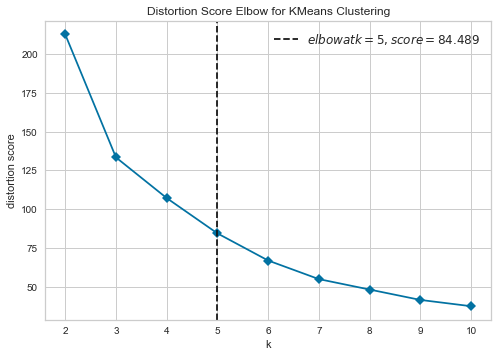

In [11]:
plot_model(geo_model, plot = 'elbow')

the elbow plot confirms the value of k


In [12]:
#merge the zones with the data set
dataset = data.merge(geo_model_results['Cluster'], left_index=True, right_index=True)

In [13]:
dataset.shape

(38288, 12)

In [14]:
dataset.head()

,request_type,species,size,call_to_dispatch_sec,lat,long,condition,temperament,incident_month,incident_weekday,incident_hour,Cluster
0,CRUELTY CASE,DOG,LARGE,2160.0,30.494640,-91.156160,FAIR,FRIENDLY,12,1,15,Cluster 1
1,TRAPPED ANIMAL,OTHER,LARGE,60.0,30.431417,-91.141070,FAIR,NORMAL,12,2,10,Cluster 1
2,STRAY,DOG,LARGE,0.0,30.648540,-91.156770,EMACIATED,FRIENDLY,12,2,9,Cluster 4
3,STRAY,DOG,SMALL,2400.0,30.429104,-91.185036,EMACIATED,NORMAL,12,2,15,Cluster 1
4,OWNER SIGNED RELEASE,DOG,EXTRA LARGE,420.0,30.529593,-91.125534,GOOD,FRIENDLY,12,2,10,Cluster 1


In [15]:
dataset.to_csv('../Data/modeling_dataset.csv', index=False)

In [16]:
#merge with visualization dataset to view on plots
visdata = pd.read_csv('../Data/Final_dataset.csv')
visdata = visdata.merge(geo_model_results['Cluster'], left_index=True, right_index=True)
visdata.to_csv('../Data/Final_dataset.csv')

In [17]:
#drop lat and long columns
dataset = dataset.drop(columns=['lat','long'])

In [18]:
plot_model(geo_model, plot = 'distribution') 